In [1]:
!pip install -q malariagen_data
!pip install -q statsmodels
!pip install -q scikit-allel
!pip install -q petl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.9/158.9 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.2/44.2 MB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 60.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 41.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.5/302.5 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.8/144.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.4/24.4 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 50.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 kB 11.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 40.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 22.2 MB/s eta

In [2]:
import allel
import malariagen_data
import pandas as pd
import numpy as np
import petl as ptl

In [3]:
# plotting setup
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.gridspec import GridSpec
import matplotlib_venn as venn
import seaborn as sns
import plotly.express as px
%config InlineBackend.figure_format = "retina"
%matplotlib inline

In [4]:
#Mounting Google Drive
import os
from google.colab import drive
drive.mount("drive")

# make dir
results_dir = "drive/MyDrive/Insecticide_resistance/"
os.makedirs(results_dir, exist_ok=True)

Mounted at drive


In [5]:
plt.rcdefaults()
sns.reset_defaults()
#sns.set_context('paper')
#sns.set_style('white')
#sns.set_style('ticks')
rcParams = plt.rcParams
base_font_size = 12
rcParams['font.size'] = base_font_size
rcParams['axes.titlesize'] = base_font_size
rcParams['axes.labelsize'] = base_font_size
rcParams['xtick.labelsize'] = base_font_size
rcParams['ytick.labelsize'] = base_font_size
rcParams['legend.fontsize'] = base_font_size
rcParams['axes.linewidth'] = .5
rcParams['lines.linewidth'] = .5
rcParams['patch.linewidth'] = .5
rcParams['ytick.direction'] = 'out'
rcParams['xtick.direction'] = 'out'
#rcParams['savefig.jpeg_quality'] = 300
rcParams['lines.markeredgewidth'] = .5
rcParams['figure.max_open_warning'] = 1000
rcParams['figure.dpi'] = 120
rcParams['figure.facecolor'] = 'w'

In [6]:
# plotting setup
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.gridspec import GridSpec
import matplotlib_venn as venn
import seaborn as sns
import plotly.express as px
%config InlineBackend.figure_format = "retina"
%matplotlib inline

In [7]:
## Importing malariagen data set
ag3 = malariagen_data.Ag3()

## Let's check the the sample set
sets = ["1191-VO-MULTI-OLOUGHLIN-VMF00106", "1191-VO-MULTI-OLOUGHLIN-VMF00140", "AG1000G-BF-A", "AG1000G-BF-B", "AG1000G-BF-C"]
df_samples = ag3.sample_metadata(sample_sets=sets)#.set_index("sample_id")

In [8]:
# define function to find metabolic resiatnce gene cluster in each contig
def get_cnv_gene(region, sample_sets, sample_query, gene):
  cnv_ = ag3.gene_cnv(region = region, sample_sets=sample_sets, sample_query=sample_query)

  ## col names
  columns = ['gene_start', 'gene_end','gene_name', 'gene_description']

  # to def
  df_cnv = cnv_['gene_contig'].to_dataframe()

  # insert other col name
  for col in columns:
    df = cnv_[f'{col}']
    df_cnv.insert(columns.index(f'{col}')+1, f'{col}', df)

  #find gene information
  gcontig, gname, gid, gstart, gend, gene_desc = [],[],[],[], [], []
  for contig,name, id, start, end, desc in zip(df_cnv.gene_contig,df_cnv.gene_name, df_cnv.gene_id, df_cnv.gene_start, df_cnv.gene_end,df_cnv.gene_description):
    if str(name)[:3]==f'{gene}':
      gname.append(name), gid.append(id), gstart.append(start), gend.append(end), gcontig.append(contig), gene_desc.append(desc)

  #create dataFrame
  df_gene = pd.DataFrame(zip(gcontig,gstart, gend, gname, gid, gene_desc), columns=['contig','start','stop', 'name', 'id', 'gene_description'])

  return df_gene

In [9]:
## function to comput cnv time series frequencies
def ds_freq_tab(ds):
  #extract cohorts into a dataframe
  cohort_vars = [v for v in ds if v.startswith("cohort_")]
  df_cohorts = ds[cohort_vars].to_dataframe()
  df_cohorts.columns = [c.split("cohort_")[1] for c in df_cohorts.columns]

  variant_labels = ds["variant_label"].values
  dfs = []
  for cohort_index, cohort in enumerate(df_cohorts.itertuples()):
    ds_cohort = ds.isel(cohorts=cohort_index)
    dict_df =  {"taxon": cohort.taxon, "area": cohort.area, "date": cohort.period_start, "period": str(cohort.period),
                "sample_size": cohort.size,"variant": variant_labels, "count": ds_cohort["event_count"].values,"nobs": ds_cohort["event_nobs"].values,
                "frequency": ds_cohort["event_frequency"].values, "frequency_ci_low": ds_cohort["event_frequency_ci_low"].values,
                "frequency_ci_upp": ds_cohort["event_frequency_ci_upp"].values
                }
    df = pd.DataFrame(dict_df)
    dfs.append(df)

  df_events = pd.concat(dfs, axis=0).reset_index(drop=True)
  df_events = df_events.query("nobs > 0")

  # Frequencies stats
  frq = df_events["frequency"]
  frq_ci_low = df_events["frequency_ci_low"]
  frq_ci_upp = df_events["frequency_ci_upp"]
  df_events["frequency_error"] = frq_ci_upp - frq
  df_events["frequency_error_minus"] = frq - frq_ci_low

  return df_events

In [10]:
## function to plot cnv times series frq
def plot_freq_time_series(data, height=450, width=900, template='plotly_white', title='CNV frequencies'):

  #plot time series frequencies
  fig = px.line(data, facet_row="area", x="date", y="frequency", error_y="frequency_error",
                error_y_minus="frequency_error_minus", color="variant", markers=True,
                height=height,width=width,template=template, title=title,
                labels={"date": "Year", "frequency": "Allelic frequencies", "variant":'Variants'})

  # figure layout
  fig.update_layout(xaxis=dict(showgrid=False, showline=True, linewidth=1, linecolor='black'),
                   yaxis=dict(showgrid=False, showline=True, linewidth=1, linecolor='gray'))
  fig.update_yaxes(range=[0, 1.0], ticks="outside", col=1)
  fig.update_xaxes(ticks="outside", col=1)

  return fig

In [11]:
## esterase,
#df_esterase, df_gste, df_cyp, region = pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), ['X', '2R', '2L', '3R', '3L']
#for item in region:
#  df_gene = get_cnv_gene(region=f'{item}', sample_sets=sets, sample_query='country=="Burkina Faso"', gene='COE')
#  if df_gene.empty == False:
#    df_esterase = df_esterase.append(df_gene)

## Gste
#for item in region:
#  df_gene = get_cnv_gene(region=f'{item}', sample_sets=sets, sample_query='country=="Burkina Faso"', gene='GST')
#  if df_gene.empty == False:
#    df_gste = df_gste.append(df_gene)

## Cyp P450
#for item in region:
#  df_gene = get_cnv_gene(region=f'{item}', sample_sets=sets, sample_query='country=="Burkina Faso"', gene='CYP')
#  if df_gene.empty == False:
#    df_cyp = df_cyp.append(df_gene)

In [12]:
#coe_id_list = list(df_esterase.id)
#gste_id_lit = list(df_gste.id)
#cyp_id_list = list(df_cyp.id)

In [13]:
## genomic region
cyp6aap_region = "2R:28,480,000-28,510,000"
cyp9k1_region = "X:15,240,000-15,250,000"
cyp6mz_region = "3R:6,924,000-6,980,000"
gste_region = "3R:28,590,000-28,610,000"
cohorts = "admin1_year"

n_xlab = ['2015','2012','2014', '2015', '2016', '2017','2012','2014', '2015', '2016', '2017']

In [14]:
## compute cnv frequencies in each gene cluster
#coe_cnv_freq = ag3.gene_cnv_frequencies(
#    region=coe_id_list,
#    cohorts=cohorts,
#    sample_sets=sets,
#    sample_query='country=="Burkina Faso"',
#    )
#gste_cnv_freq = ag3.gene_cnv_frequencies(
#    region=gste_id_lit,
#    cohorts=cohorts,
#    sample_sets=sets,
#    sample_query='country=="Burkina Faso"',
#    )
#cyp_cnv_freq = ag3.gene_cnv_frequencies(
#    region=cyp_id_list,
#    cohorts=cohorts,
#    sample_sets=sets,
#    sample_query='country=="Burkina Faso"',
#    )

In [15]:
## compute time serie cnv frequencies
#gste_cnv_freq_ts = ag3.gene_cnv_frequencies_advanced(
#    region=gste_id_lit,
#    area_by="admin1_iso",
#    period_by="year",
#    sample_sets=sets,
#    sample_query="country == 'Burkina Faso'",
#    variant_query="max_af > 0.05"
#    )
#cyp_cnv_freq_ts = ag3.gene_cnv_frequencies_advanced(
#    region=cyp_id_list,
#    area_by="admin1_iso",
#    period_by="year",
#    sample_sets=sets,
#    sample_query="country == 'Burkina Faso'",
#    variant_query="max_af > 0.05"
#    )
#coe_cnv_freq_ts = ag3.gene_cnv_frequencies_advanced(
#    region=coe_id_list,
#    area_by="admin1_iso",
#    period_by="year",
#    sample_sets=sets,
#    sample_query="country == 'Burkina Faso'",
#    variant_query="max_af > 0.05"
#    )

# warping to freq tab
#df_events_cyp = ds_freq_tab(cyp_cnv_freq_ts)
#df_events_gste = ds_freq_tab(gste_cnv_freq_ts)
#df_events_coe = ds_freq_tab(coe_cnv_freq_ts)

In [16]:
## def columns
#freq_columns = [col for col in cyp_cnv_freq.columns if col.startswith('frq_')]

## remove unamed gene data
#cyp_cnv_frq = cyp_cnv_freq.reset_index().query('gene_name.notna()', engine='python')
#coe_cnv_frq = coe_cnv_freq.reset_index().query('gene_name.notna()', engine='python')
#gste_cnv_frq = gste_cnv_freq.reset_index().query('gene_name.notna()', engine='python')

In [17]:
## save data to csv
#coe_cnv_frq.to_csv('drive/MyDrive/Insecticide_resistance/CNV/coe_cnv_frq.csv')
#cyp_cnv_frq.to_csv('drive/MyDrive/Insecticide_resistance/CNV/cyp_cnv_frq.csv')
#gste_cnv_frq.to_csv('drive/MyDrive/Insecticide_resistance/CNV/gste_cnv_frq.csv')

In [18]:
## read data
coe_cnv_frq = pd.read_csv('drive/MyDrive/Insecticide_resistance/CNV/coe_cnv_frq.csv')
cyp_cnv_frq = pd.read_csv('drive/MyDrive/Insecticide_resistance/CNV/cyp_cnv_frq.csv')
gste_cnv_frq = pd.read_csv('drive/MyDrive/Insecticide_resistance/CNV/gste_cnv_frq.csv')

In [19]:
freq_columns = ['frq_BF-09_arab_2015', 'frq_BF-09_colu_2012', 'frq_BF-09_colu_2014', 'frq_BF-09_colu_2015',
                'frq_BF-09_colu_2016', 'frq_BF-09_colu_2017', 'frq_BF-09_gamb_2012', 'frq_BF-09_gamb_2014',
                'frq_BF-09_gamb_2015', 'frq_BF-09_gamb_2016','frq_BF-09_gamb_2017']
col_lab = ['An. arabiensis (2015)', 'An. coluzzii (2012)','An. coluzzii (2014)','An. coluzzii (2015)',
           'An. coluzzii (2016)','An. coluzzii (2017)', 'An. gambiae ss (2012)', 'An. gambiae ss (2014)','An. gambiae ss (2015)',
           'An. gambiae ss (2016)','An. gambiae ss (2017)']

# Analysing esterase frequencies

<ipython-input-20-9a29b0f9660d>:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


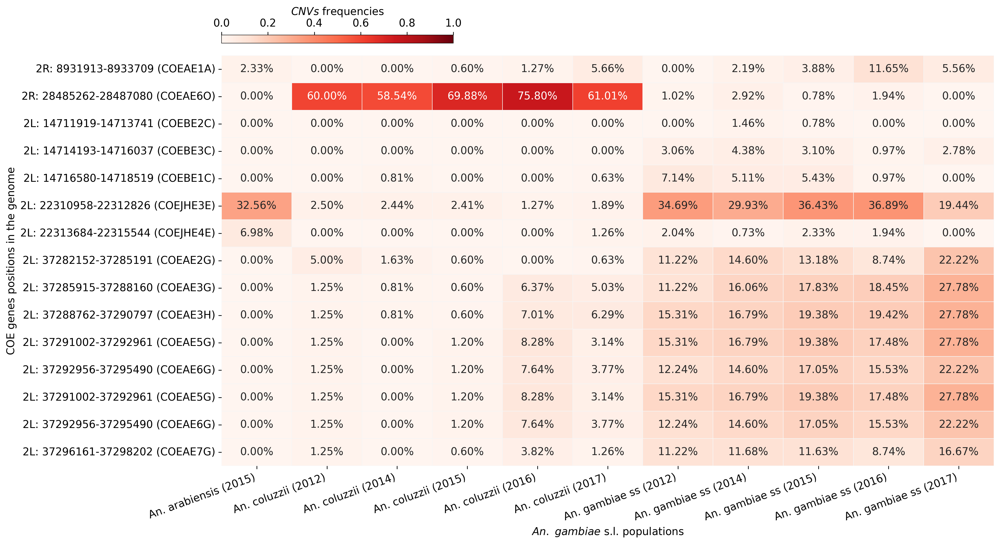

In [20]:
# plot allele freqs per pop
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig = plt.figure(figsize=(16,8))
#sns.set(font_scale = 1)
#Selecting data
select_coe = coe_cnv_frq.query('max_af > 0.05')
ptl_df_coe = ptl.fromdataframe(select_coe)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_coe.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_coe[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=sorted(col_lab), linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="$An.$ $gambiae$ s.l. populations", ylabel = 'COE genes positions in the genome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$CNVs$ frequencies')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_coe_eng.png', dpi=300, bbox_inches='tight')

<ipython-input-21-90b93dd94ced>:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


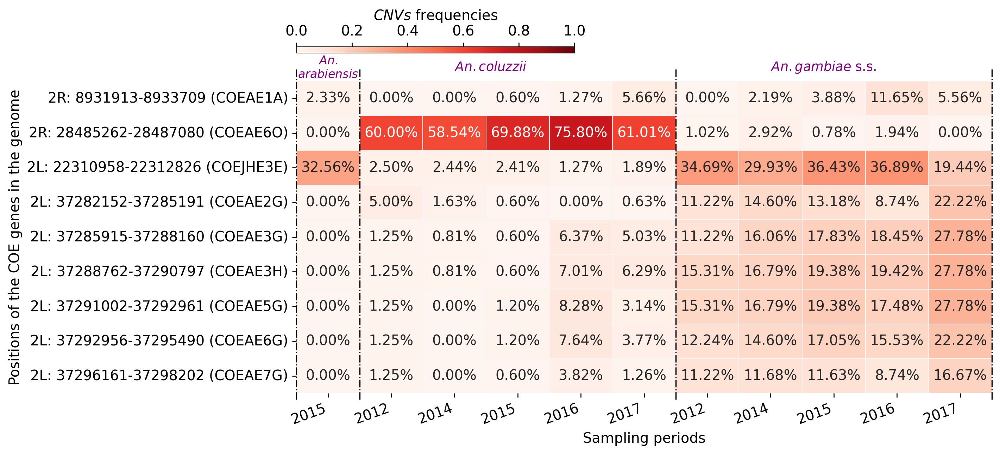

In [21]:
# plot allele freqs per pop
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig = plt.figure(figsize=(12,5))
#sns.set(font_scale = 1)
#Selecting data
select_coe = coe_cnv_frq.query('max_af > 0.08')
select_coe = select_coe.drop_duplicates(subset=['gene_id', 'gene_name', 'cnv_type', 'start', 'end'])
ptl_df_coe = ptl.fromdataframe(select_coe)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_coe.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

## xlab and col
#col_select = freq_columns.copy()
#col_select.remove('frq_BF-09_arab_2015')
#xlab = col_lab.copy()
#xlab.remove('An. arabiensis (2015)')

# plot
ax=sns.heatmap(select_coe[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=n_xlab, linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

## ax label
ax.set_xlabel("Sampling periods")
ax.set_ylabel('Positions of the COE genes in the genome')

## Legend## Legend
cax = inset_axes(ax,width="40%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.09, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$CNVs$ frequencies')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_coe_eng1_300X.png', dpi=300, bbox_inches='tight')
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_coe_eng1_150X.png', dpi=150, bbox_inches='tight')

<ipython-input-22-55b7d9097ce4>:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


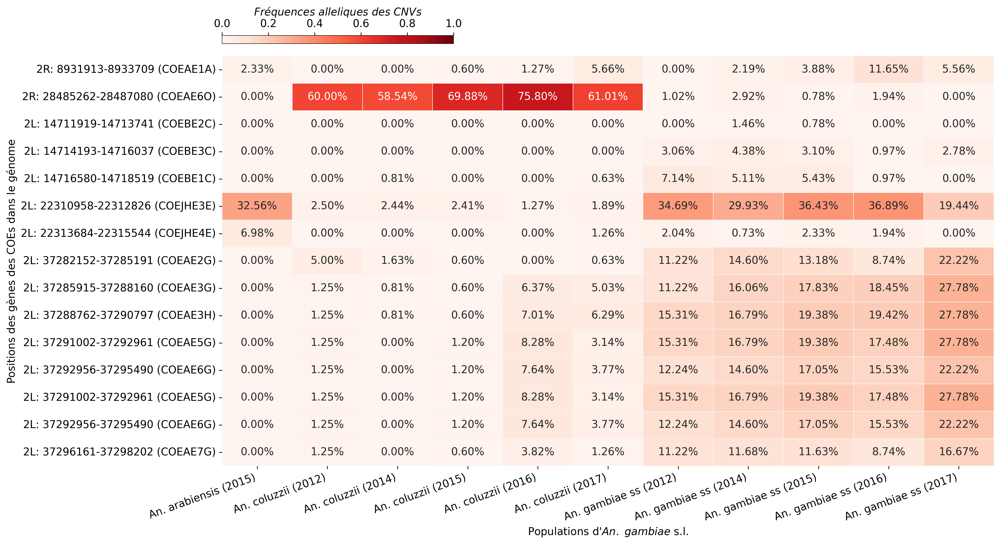

In [22]:
# plot allele freqs per pop
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig = plt.figure(figsize=(16,8))
#sns.set(font_scale = 1)
#Selecting data
select_coe = coe_cnv_frq.query('max_af > 0.05')
ptl_df_coe = ptl.fromdataframe(select_coe)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_coe.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_coe[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=sorted(col_lab), linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="Populations d'$An.$ $gambiae$ s.l.", ylabel = 'Positions des gènes des COEs dans le génome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_coe_fr.png', dpi=300, bbox_inches='tight')

<ipython-input-23-6ac41af46e16>:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


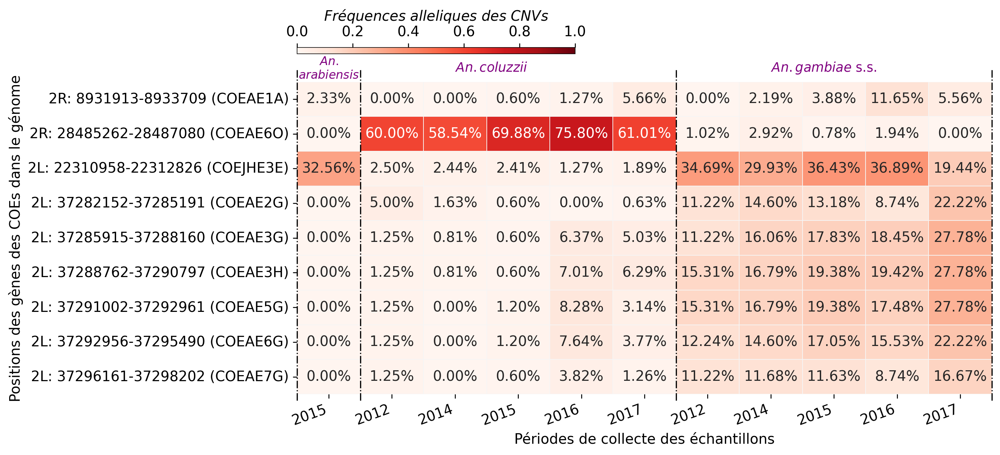

In [23]:
# plot allele freqs per pop
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig = plt.figure(figsize=(12,5))
#sns.set(font_scale = 1)
#Selecting data
select_coe = coe_cnv_frq.query('max_af > 0.08')
select_coe = select_coe.drop_duplicates(subset=['gene_id', 'gene_name', 'cnv_type', 'start', 'end'])
ptl_df_coe = ptl.fromdataframe(select_coe)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_coe.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

## xlab and col
#col_select = freq_columns.copy()
#col_select.remove('frq_BF-09_arab_2015')
#xlab = col_lab.copy()
#xlab.remove('An. arabiensis (2015)')

# plot
ax=sns.heatmap(select_coe[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=n_xlab, linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

## ax label
ax.set_xlabel("Périodes de collecte des échantillons")
ax.set_ylabel('Positions des gènes des COEs dans le génome')

## Legend## Legend
cax = inset_axes(ax,width="40%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.09, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_coe_fr1_300X.png', dpi=300, bbox_inches='tight')
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_coe_fr1_150X.png', dpi=150, bbox_inches='tight')

In [24]:
Input = [0.7689454, 0.232999, 0.98867, 0.83748789]

# Using list comprehension
Output = ["{:.2%}".format(elem) for elem in Input]
Output

['76.89%', '23.30%', '98.87%', '83.75%']

In [25]:
#df_events_coe.columns, df_events_coe.variant.unique()

In [26]:
#vars = ['AGAP005835 (COEJHE3E) amp','AGAP006723 (COEAE2G) amp','AGAP006724 (COEAE3G) amp', 'AGAP006725 (COEAE3H) amp',
#        'AGAP006726 (COEAE5G) amp', 'AGAP006727 (COEAE6G) amp','AGAP006728 (COEAE7G) amp',]

In [27]:
#fig1 = plot_freq_time_series(df_events_coe.query(f'taxon=="coluzzii" and variant =="AGAP002863 (COEAE6O) amp"'), title='esterase  CNV freq')
#fig1.update_layout(font_color='black')

In [28]:
#coe_cnv_frq.query('max_af > 0.04')

#Analysing gste frequencies

<ipython-input-29-156788b6aa61>:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


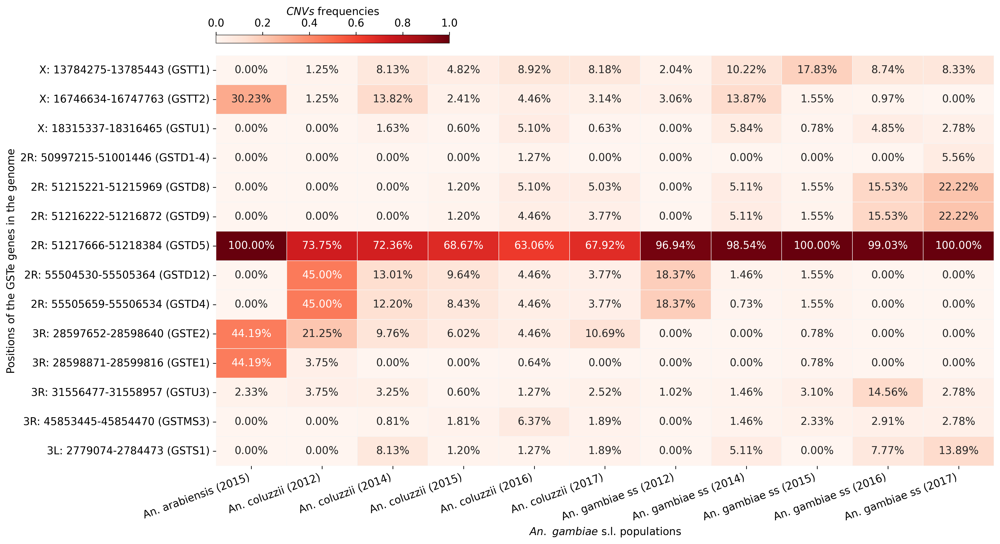

In [29]:
# plot allele freqs per pop
fig = plt.figure(figsize=(16,8))
#Selecting data
select_gste = gste_cnv_frq.query('max_af > 0.05')
ptl_df_gste = ptl.fromdataframe(select_gste)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_gste.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_gste[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=sorted(col_lab), linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="$An.$ $gambiae$ s.l. populations", ylabel = 'Positions of the GSTe genes in the genome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$CNVs$ frequencies')

fig.tight_layout()

#save fig
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_eng.png', dpi=300, bbox_inches='tight')

<ipython-input-30-30578f8b2037>:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


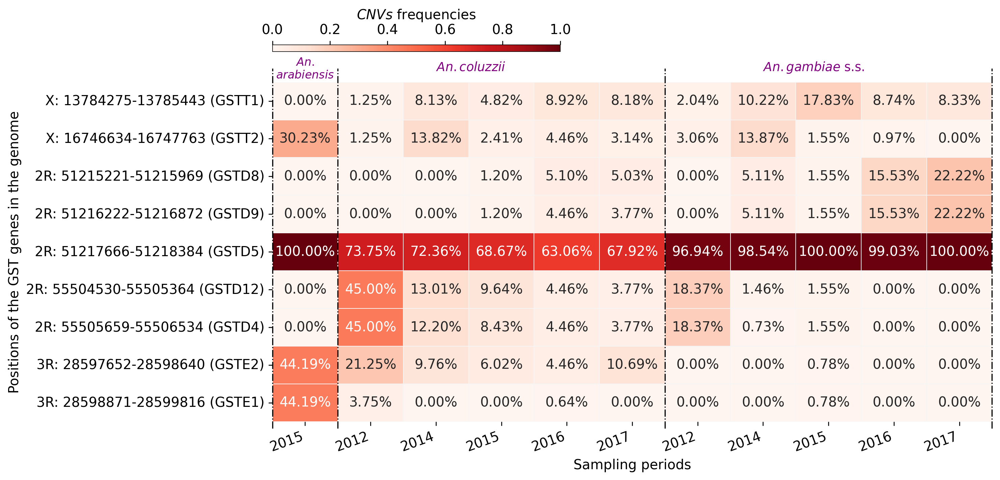

In [30]:
# plot allele freqs per pop
fig = plt.figure(figsize=(12.5,5.5))
#Selecting data
select_gste = gste_cnv_frq.query('max_af > 0.15')
ptl_df_gste = ptl.fromdataframe(select_gste)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_gste.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_gste[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=n_xlab, linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

## ax label
ax.set_xlabel("Sampling periods")
ax.set_ylabel('Positions of the GST genes in the genome')

## Legend## Legend
cax = inset_axes(ax,width="40%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.09, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$CNVs$ frequencies')

fig.tight_layout()

#save fig
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_eng1_300X.png', dpi=300, bbox_inches='tight')
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_eng1_150X.png', dpi=150, bbox_inches='tight')

<ipython-input-31-bbb199345df6>:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


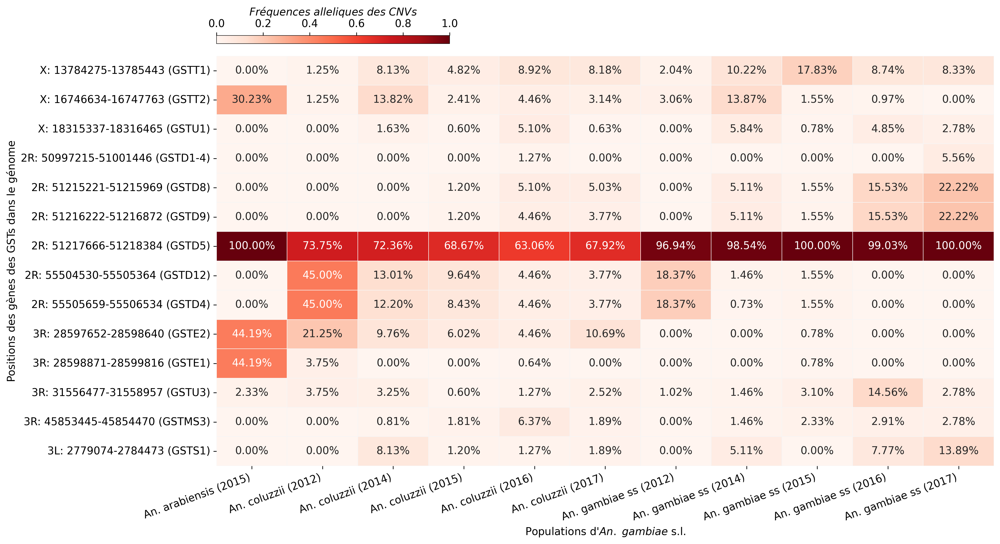

In [31]:
# plot allele freqs per pop
fig = plt.figure(figsize=(16,8))
#Selecting data
select_gste = gste_cnv_frq.query('max_af > 0.05')
ptl_df_gste = ptl.fromdataframe(select_gste)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_gste.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_gste[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=col_lab, linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="Populations d'$An.$ $gambiae$ s.l.", ylabel = 'Positions des gènes des GSTs dans le génome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

#save fig
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_fr.png', dpi=300, bbox_inches='tight')

<ipython-input-32-2bdf139ca427>:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


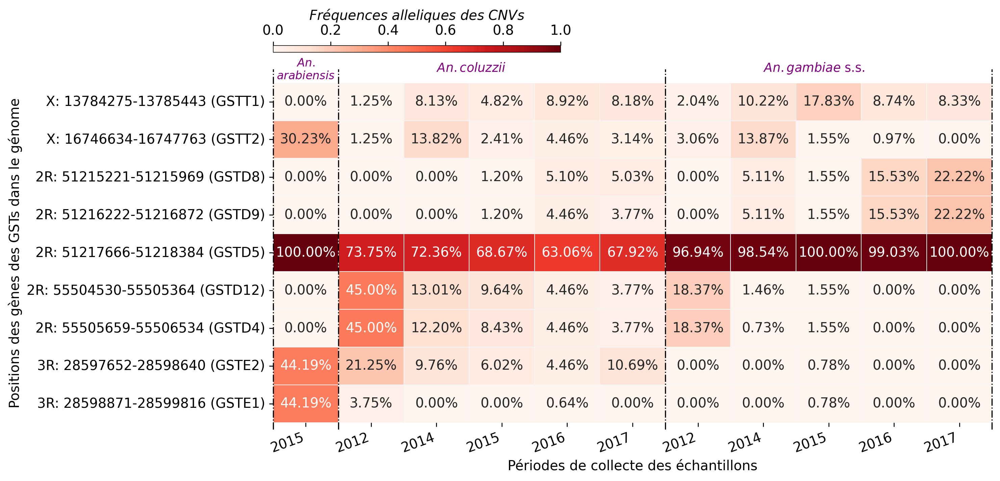

In [32]:
# plot allele freqs per pop
fig = plt.figure(figsize=(12.5,5.5))
#Selecting data
select_gste = gste_cnv_frq.query('max_af > 0.15')
ptl_df_gste = ptl.fromdataframe(select_gste)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_gste.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_gste[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=n_xlab, linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

## ax label
ax.set_xlabel("Périodes de collecte des échantillons")
ax.set_ylabel('Positions des gènes des GSTs dans le génome')

## Legend
cax = inset_axes(ax,width="40%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.09, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

#save fig
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_fr1_300X.png', dpi=300, bbox_inches='tight')
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_fr1_150X.png', dpi=150, bbox_inches='tight')

<ipython-input-33-1769d57d3afc>:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


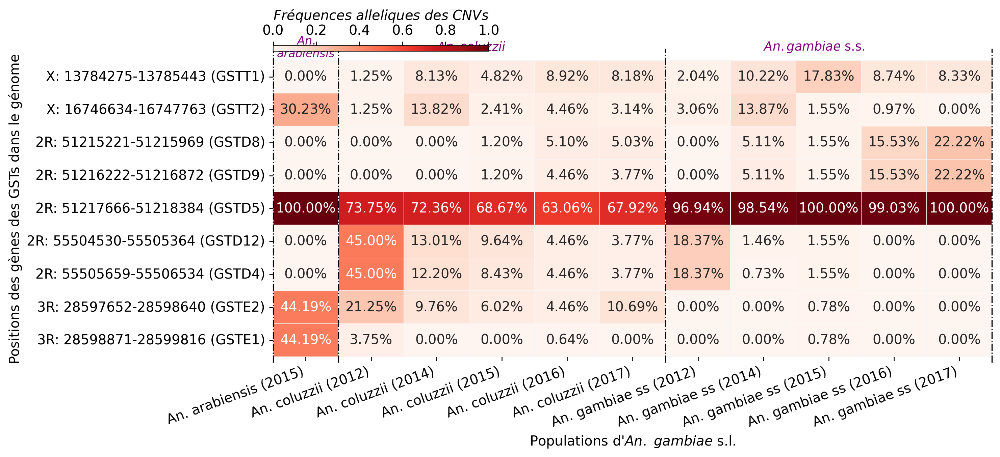

In [33]:
# plot allele freqs per pop
fig = plt.figure(figsize=(12.5,5.5))
#Selecting data
select_gste = gste_cnv_frq.query('max_af > 0.15')
ptl_df_gste = ptl.fromdataframe(select_gste)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_gste.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_gste[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels,
               xticklabels=sorted(col_lab), linewidths=0.5, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

ax.set(xlabel="Populations d'$An.$ $gambiae$ s.l.", ylabel = 'Positions des gènes des GSTs dans le génome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

#save fig
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_gste_fr1.png', dpi=300, bbox_inches='tight')

In [34]:
#fig2 = plot_freq_time_series(df_events_gste.query(f'taxon=="coluzzii" and variant =="AGAP004173 (GSTD5) del"'), title='Gste CNV freq')
#fig2.update_layout(font_color='black')

In [35]:
#fig3 = plot_freq_time_series(df_events_gste.query(f'taxon=="gambiae" and variant =="AGAP004173 (GSTD5) del"  and period > "2004"'), title='Gste CNV freq')
#fig3.update_layout(font_color='black')

In [36]:
#gste_cnv_frq.query('max_af > 0.05')

#Analysing cyp frequencies

In [37]:
cyp_list = list(cyp_cnv_frq.query('max_af > 0.05').gene_name)
print(len(cyp_list))
#cyp_list

58


In [38]:
cyp_selected_list = ['CYP9K1', 'CYP6P3','CYP6P3','CYP6P5','CYP6P4','CYP6P1','CYP6P2','CYP6AA1','CYP6AA2','CYP6P15P',
                     'CYP6Z3','CYP6Z2','CYP6Z2','CYP6Z1','CYP9M1','CYP9M1','CYP9M2','CYP6AF1','CYP6AF2','CYP6AF2','CYP12F3','CYP12F2','CYP12F2','CYP12F1',]

cyp_list_sel = ['CYP9K1', 'CYP6P3','CYP6P3','CYP6P5','CYP6P4','CYP6P1','CYP6P2','CYP6AA1','CYP6AA2','CYP6P15P',
                'CYP6Z3','CYP6Z2','CYP6Z2','CYP6Z1','CYP9M1','CYP9M1','CYP9M2','CYP6AF1','CYP6AF2','CYP6AF2','CYP12F3','CYP12F2']

In [39]:
#cyp_cnv_frq.query(f'gene_name == {cyp_selected_list} and max_af > 0.1')

<ipython-input-40-2a7bf37f6057>:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


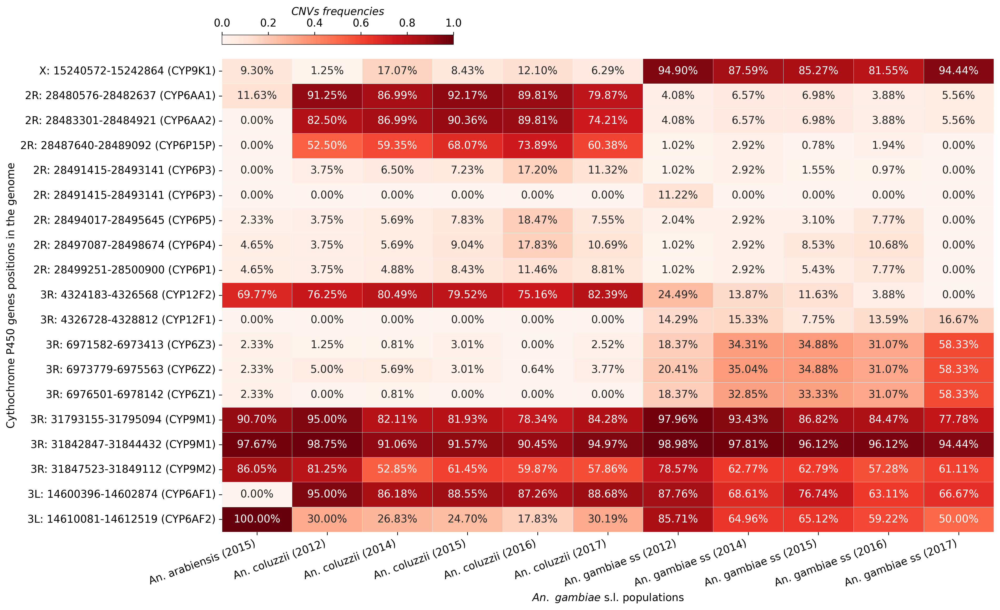

In [40]:
## Plot allele freqs per pop
fig, ax = plt.subplots(figsize=(16,9))
#sns.set(font_scale = 1)
#Selecting data
select_cyp = cyp_cnv_frq.query(f'gene_name == {cyp_selected_list} and max_af > 0.1')
ptl_df_cyp = ptl.fromdataframe(select_cyp)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_cyp.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_cyp[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels, linewidths=0.25,
               xticklabels=sorted(col_lab),linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="$An.$ $gambiae$ s.l. populations", ylabel = 'Cythochrome P450 genes positions in the genome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$CNVs$ $frequencies$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_eng.png', dpi=300, bbox_inches='tight')

<ipython-input-41-0a34af66d805>:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


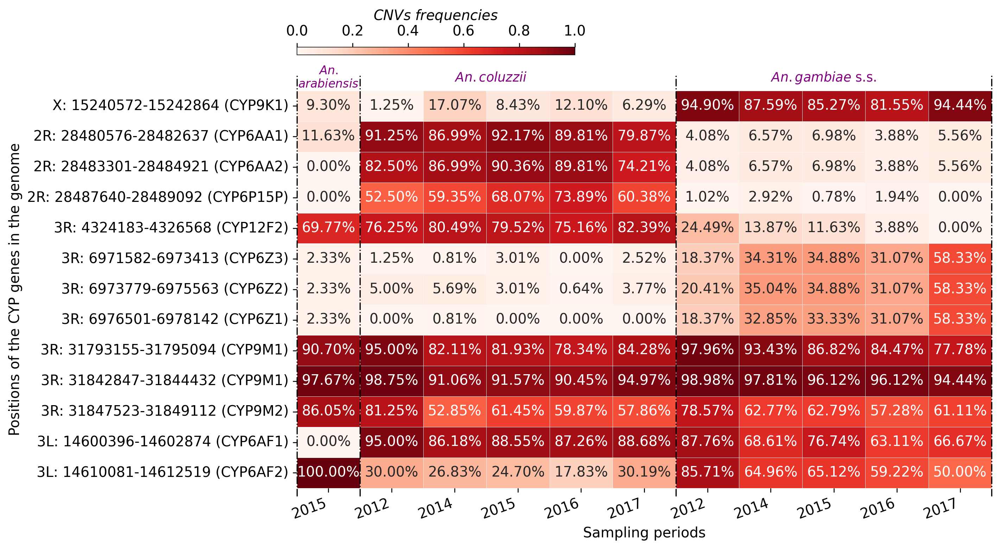

In [41]:
## Plot allele freqs per pop
fig, ax = plt.subplots(figsize=(12,6))
#sns.set(font_scale = 1)
#Selecting data
select_cyp = cyp_cnv_frq.query(f'gene_name == {cyp_selected_list} and max_af > 0.2')
ptl_df_cyp = ptl.fromdataframe(select_cyp)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_cyp.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_cyp[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels, linewidths=0.25,
               xticklabels=n_xlab,linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

## ax label
ax.set_xlabel("Sampling periods")
ax.set_ylabel('Positions of the CYP genes in the genome')

## Legend## Legend
cax = inset_axes(ax,width="40%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.09, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$CNVs$ $frequencies$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_eng1_300X.png', dpi=300, bbox_inches='tight')
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_eng1_150X.png', dpi=150, bbox_inches='tight')

<ipython-input-42-9611d6e0e29e>:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


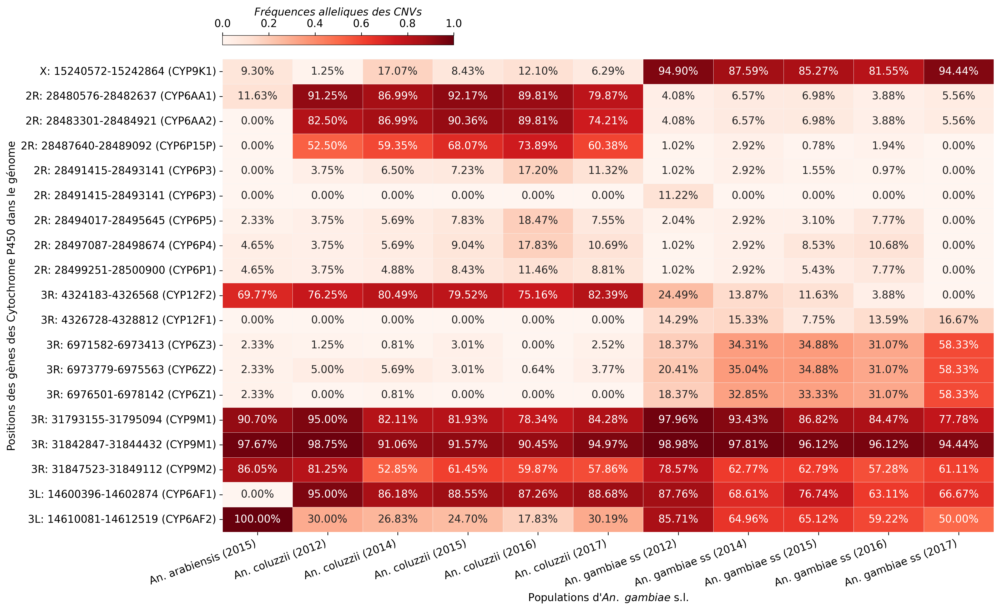

In [42]:
## Plot allele freqs per pop
fig, ax = plt.subplots(figsize=(16,9))
#sns.set(font_scale = 1)
#Selecting data
select_cyp = cyp_cnv_frq.query(f'gene_name == {cyp_selected_list} and max_af > 0.1')
ptl_df_cyp = ptl.fromdataframe(select_cyp)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_cyp.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_cyp[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels, linewidths=0.25,
               xticklabels=sorted(col_lab),linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="Populations d'$An.$ $gambiae$ s.l.", ylabel = 'Positions des gènes des Cytochrome P450 dans le génome')

cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_fr.png', dpi=300, bbox_inches='tight')

<ipython-input-43-a9c83a781d99>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


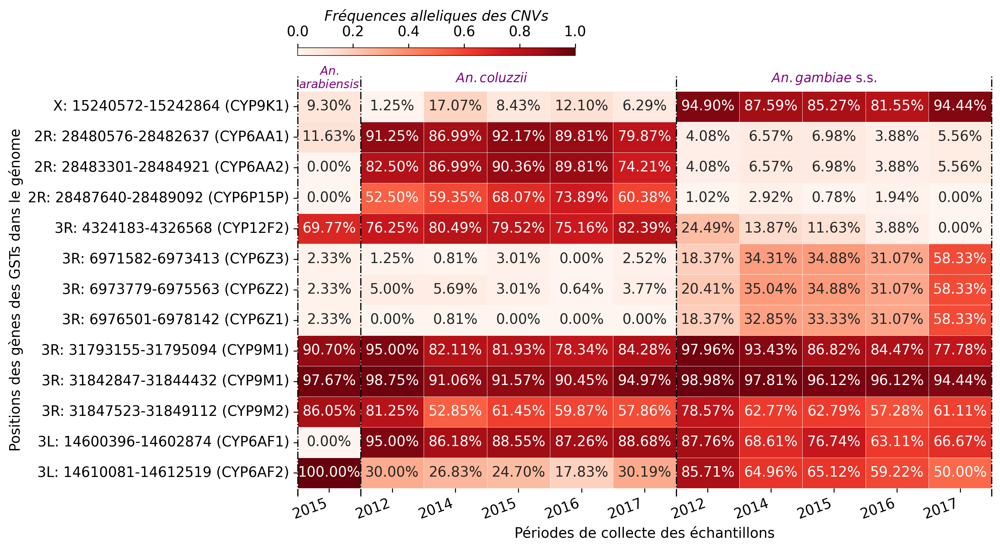

In [43]:
## Plot allele freqs per pop
fig, ax = plt.subplots(figsize=(12,6))
#sns.set(font_scale = 1)
#Selecting data
select_cyp = cyp_cnv_frq.query(f'gene_name == {cyp_selected_list} and max_af > 0.2')
ptl_df_cyp = ptl.fromdataframe(select_cyp)

#set labels
labels = ['%s: %s-%s (%s)' % (rec.contig, rec.start, rec.end, rec.gene_name) for rec in ptl_df_cyp.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_cyp[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels, linewidths=0.25,
               xticklabels=n_xlab,linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

## line to separate samples
plt.axvline(x=0, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=1, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=6, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)
plt.axvline(x=11, ymin=-0.02, ymax=1.04, ls='dashdot',color='k',clip_on=False,lw=1)

##Text
plt.text(0.5, -0.1, '$An.$'+ '\n$arabiensis$', ha = 'center', size=10, color='purple')
plt.text(2.5, -0.3, '$An. coluzzii$', size=11, color='purple')
plt.text(7.5, -0.3, '$An. gambiae$'+' s.s.', size=11, color='purple')

## ax label
ax.set_xlabel("Périodes de collecte des échantillons")
ax.set_ylabel('Positions des gènes des GSTs dans le génome')
#ax.set(xlabel="Populations d'$An.$ $gambiae$ s.l.", ylabel = 'Positions des gènes des Cytochrome P450 dans le génome')

## Legend
cax = inset_axes(ax,width="40%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.09, 1, 1),
                 bbox_transform=ax.transAxes,borderpad=0)
mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_fr1_300X.png', dpi=300, bbox_inches='tight')
fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_fr1_150X.png', dpi=150, bbox_inches='tight')

In [44]:
freq_columns

['frq_BF-09_arab_2015',
 'frq_BF-09_colu_2012',
 'frq_BF-09_colu_2014',
 'frq_BF-09_colu_2015',
 'frq_BF-09_colu_2016',
 'frq_BF-09_colu_2017',
 'frq_BF-09_gamb_2012',
 'frq_BF-09_gamb_2014',
 'frq_BF-09_gamb_2015',
 'frq_BF-09_gamb_2016',
 'frq_BF-09_gamb_2017']

In [45]:
xtick_n = ['Aa (2015)', 'Ac (2012)','Ac (2014)','Ac (2015)','Ac (2016)','Ac (2017)',
           'Ag (2012)','Ag (2014)','Ag (2015)','Ag (2016)','Ag (2017)',]

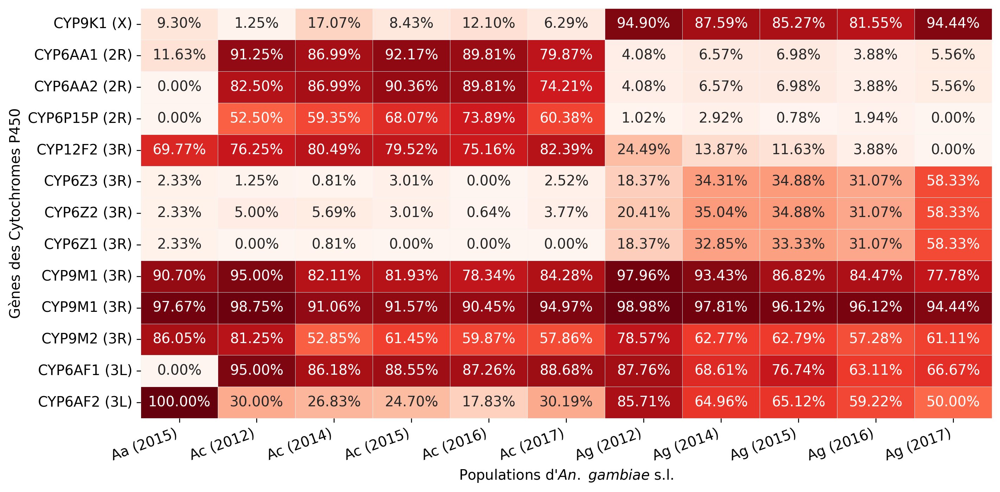

In [46]:
## Plot allele freqs per pop
fig, ax = plt.subplots(figsize=(12,6))
#sns.set(font_scale = 1)
#Selecting data
select_cyp = cyp_cnv_frq.query(f'gene_name == {cyp_selected_list} and max_af > 0.2')
ptl_df_cyp = ptl.fromdataframe(select_cyp)

#set labels
labels = ['%s (%s)' % ( rec.gene_name, rec.contig) for rec in ptl_df_cyp.records()]
color_2 = sns.color_palette("Reds", as_cmap=True)

# plot
ax=sns.heatmap(select_cyp[sorted(freq_columns)], vmin=0, vmax=1, fmt='.2%', cmap=color_2, yticklabels=labels, linewidths=0.25,
               xticklabels=xtick_n, linecolor="whitesmoke",annot=True, cbar=False)
plt.xticks(rotation=20, ha='right')

ax.set(xlabel="Populations d'$An.$ $gambiae$ s.l.", ylabel = 'Gènes des Cytochromes P450')

#cax = inset_axes(ax,width="30%", height="2%", loc='lower left', bbox_to_anchor=(0, 1.03, 1, 1),
#                 bbox_transform=ax.transAxes,borderpad=0)
#mpl.colorbar.ColorbarBase(cax,orientation='horizontal', ticklocation='top',cmap=color_2,
#                         label='$Fréquences$ $alleliques$ $des$ $CNVs$')

fig.tight_layout()

fig.savefig('drive/MyDrive/Insecticide_resistance/CNV/cnv_cyp_fr1_1.png', dpi=150, bbox_inches='tight')

In [47]:
freq_columns

['frq_BF-09_arab_2015',
 'frq_BF-09_colu_2012',
 'frq_BF-09_colu_2014',
 'frq_BF-09_colu_2015',
 'frq_BF-09_colu_2016',
 'frq_BF-09_colu_2017',
 'frq_BF-09_gamb_2012',
 'frq_BF-09_gamb_2014',
 'frq_BF-09_gamb_2015',
 'frq_BF-09_gamb_2016',
 'frq_BF-09_gamb_2017']